In [1]:
import numpy as np
import sys
import pickle
import os
import re
import json
import h5py as h5
import matplotlib.pyplot as plt
from skimage.io import imread
import cv2

In [2]:
import pyvista as pv
from itkwidgets import view

In [3]:
import torch

from pytorch3d.ops import cubify

from pytorch3d.io import save_ply, save_obj, load_objs_as_meshes, load_obj, load_ply

from pytorch3d.structures import Meshes

from pytorch3d.renderer import (
    look_at_view_transform,
    FoVPerspectiveCameras, 
    PointLights, 
    DirectionalLights, 
    Materials, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    SoftPhongShader,
    HardPhongShader,
    TexturesUV,
    Textures
)

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [5]:
# Setup Torch Device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")
    
device

device(type='cuda', index=0)

In [6]:
git_project_directory = '/home/ubuntu/Insight/DeepDream3D/'

In [7]:
shapenet_cam_params_file = git_project_directory + 'data/metadata/rendering_metadata.json' 
with open(shapenet_cam_params_file) as f:
  shapenet_cam_params = json.load(f)

In [8]:
param_num = 23
R, T = look_at_view_transform(
    dist=shapenet_cam_params["distance"][param_num]*3, 
    elev=shapenet_cam_params["elevation"][param_num], 
    azim=shapenet_cam_params["azimuth"][param_num]) 
cameras = FoVPerspectiveCameras(device=device, 
                                R=R, 
                                T=T,
                                fov=shapenet_cam_params["field_of_view"][param_num]
                               )

raster_settings = RasterizationSettings(
    image_size=512, 
    blur_radius=0.0, 
    faces_per_pixel=1, 
)

lights = PointLights(device=device, location=[[0.0, 0.0, -3.0]])

renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(
        device=device, 
        cameras=cameras,
        lights=lights
    )
)

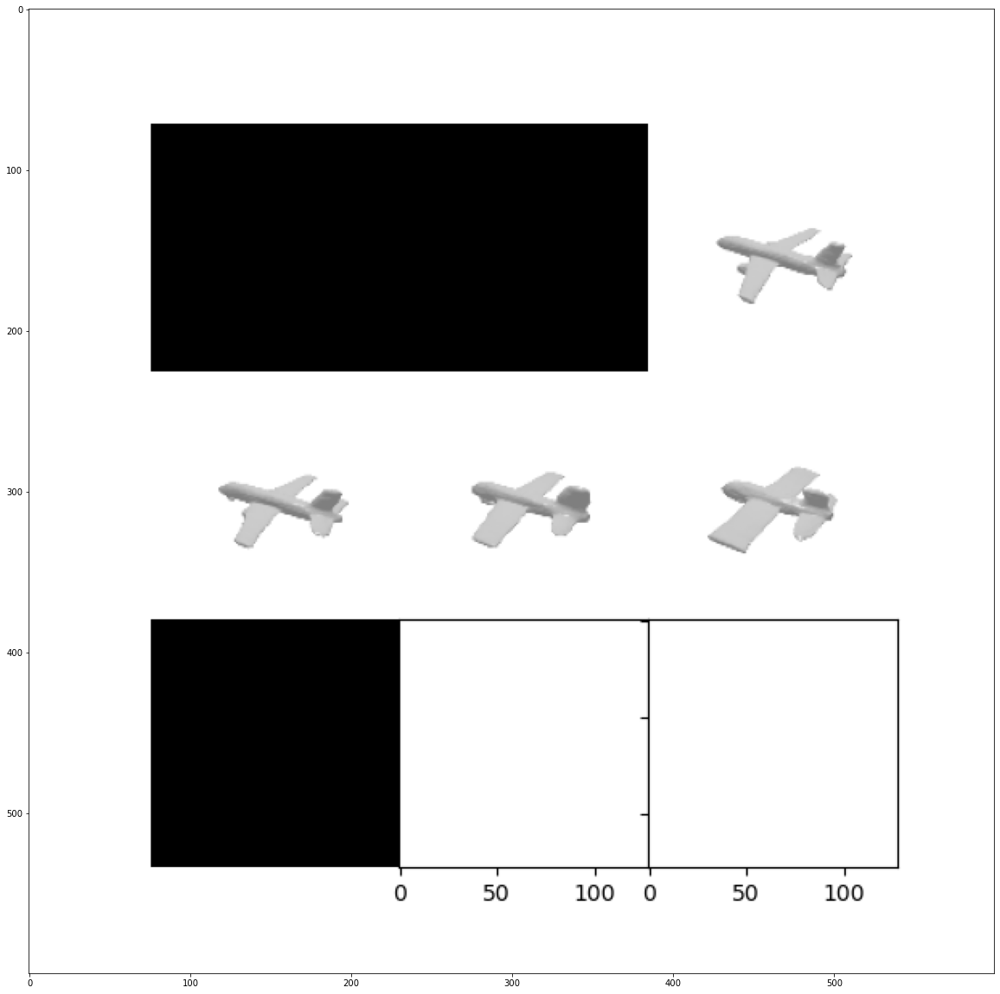

In [31]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1600_layer_3/'
output_filename = 'annealing_images.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
#image = np.random.random(size=(100,100))
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)

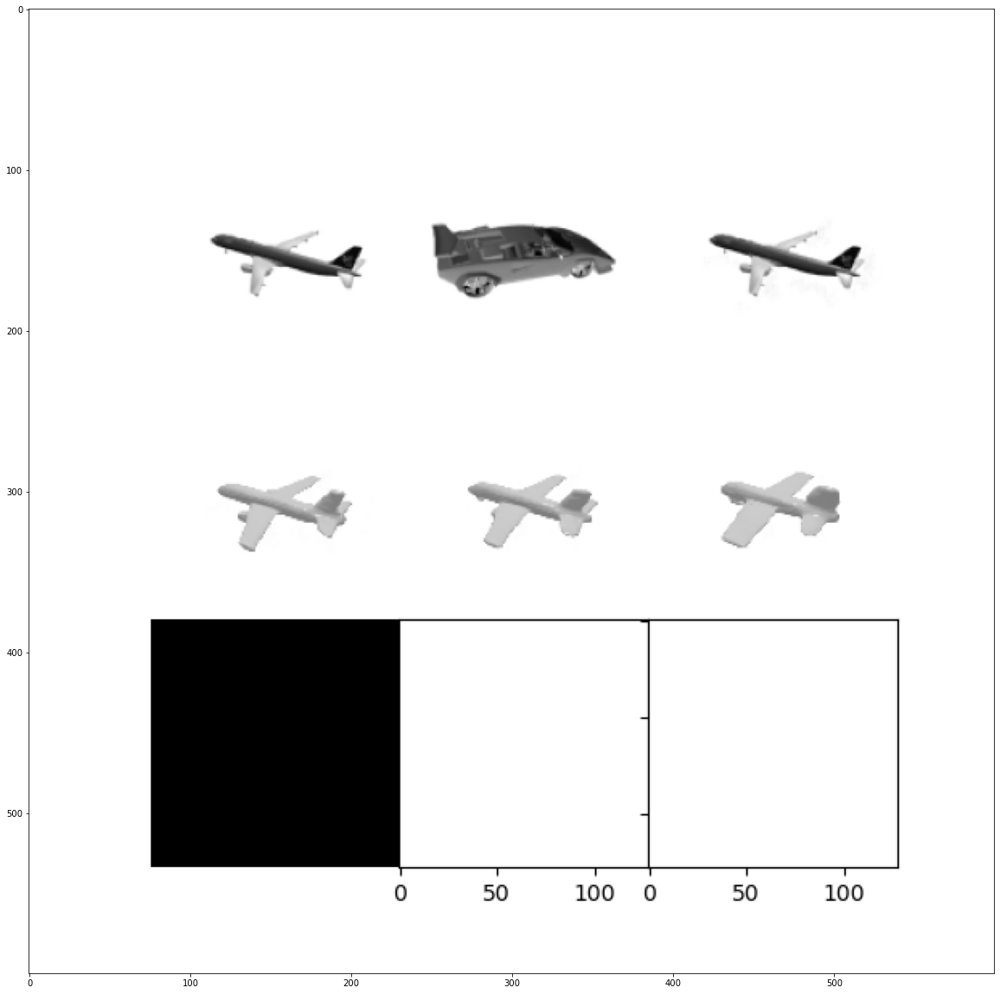

In [32]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1600_layer_3/'
output_filename = 'deepdream_images.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
#image = np.random.random(size=(100,100))
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)

In [33]:
interpolation_dir = output_filepath
files = os.listdir(interpolation_dir)
verts = []
faces = []
verts_rgb = []
titles = []
for file in files:
    if file.split('.')[1] == 'ply':
        titles.append(file.split('/')[-1])
        vert, face = load_ply(interpolation_dir + file)
        verts.append(vert.to(device))
        faces.append(face.to(device))
        verts_rgb.append(torch.ones_like(vert).to(device))

textures = Textures(verts_rgb=verts_rgb)
interpol_mesh = Meshes(verts, faces, textures)

print(interpol_mesh.isempty())
print(interpol_mesh.num_verts_per_mesh())

images = renderer(interpol_mesh).cpu().numpy()

tensor(False, device='cuda:0')
tensor([31556, 81410, 34376, 34058, 36816, 40160], device='cuda:0')


In [34]:
image_mean = images[images < .99].mean()
image_min = images[images < .99].min()
image_max = 1.0
images[images < .99] = (images[images < .99] - image_min) / (image_max - image_min)

2
5


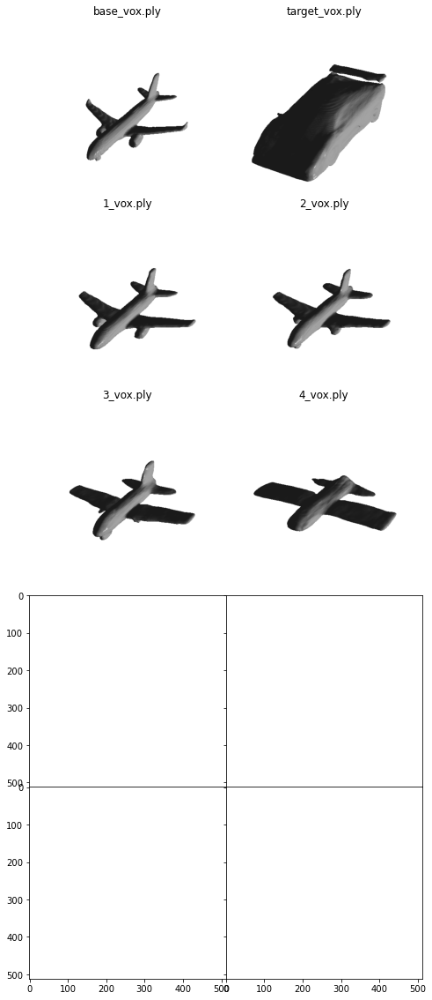

In [35]:
num_images = int(images.shape[0])
rows = 5 
cols = -int(-num_images // rows)
print(cols)
print(rows)

fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols, 
                        sharex=True, 
                        sharey=True, 
                        figsize=(cols*4,rows*4),
                        gridspec_kw={'wspace': 0, 'hspace':0}
                        )
for ax, im in zip(axs.flatten(), range(num_images)):
    ax.set_title(titles[im])
    ax.imshow(images[im,:,:,:3])
    ax.axis('off')


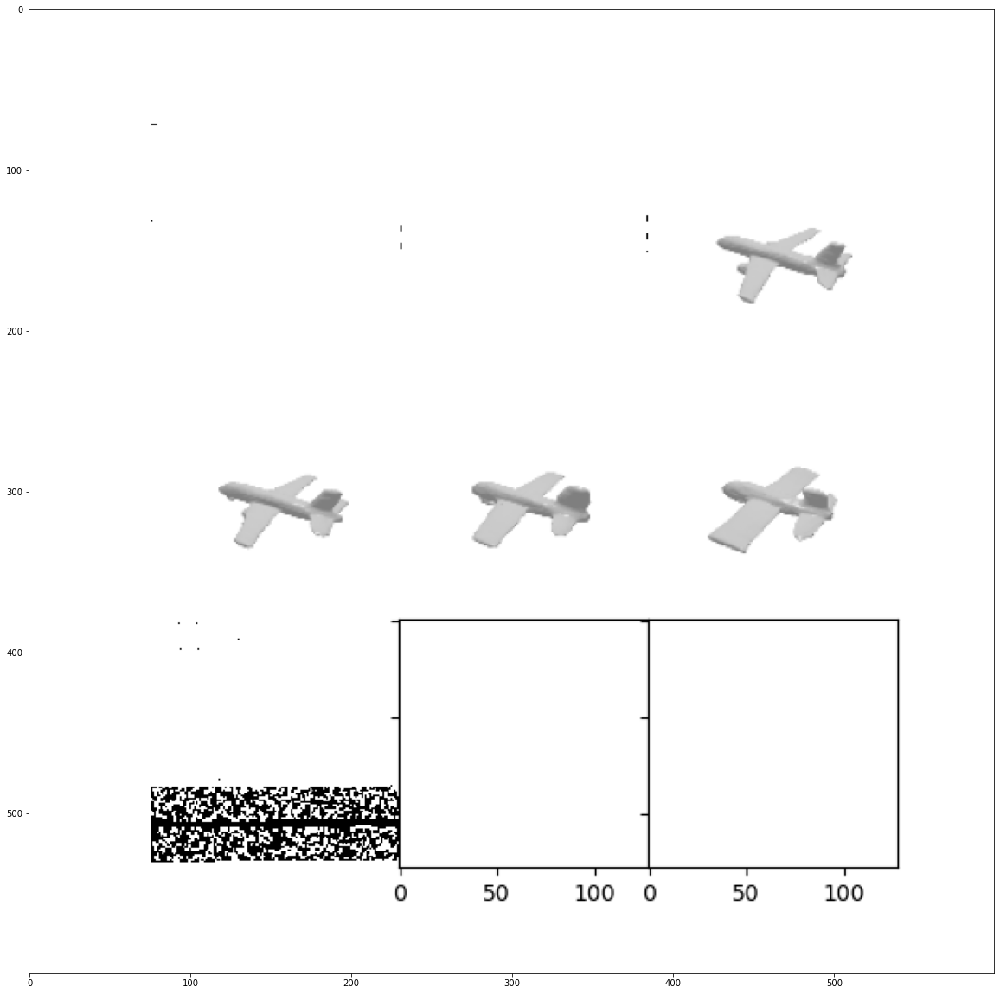

In [12]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1600_layer_3/'
output_filename = 'annealing_images.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
#image = np.random.random(size=(100,100))
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)

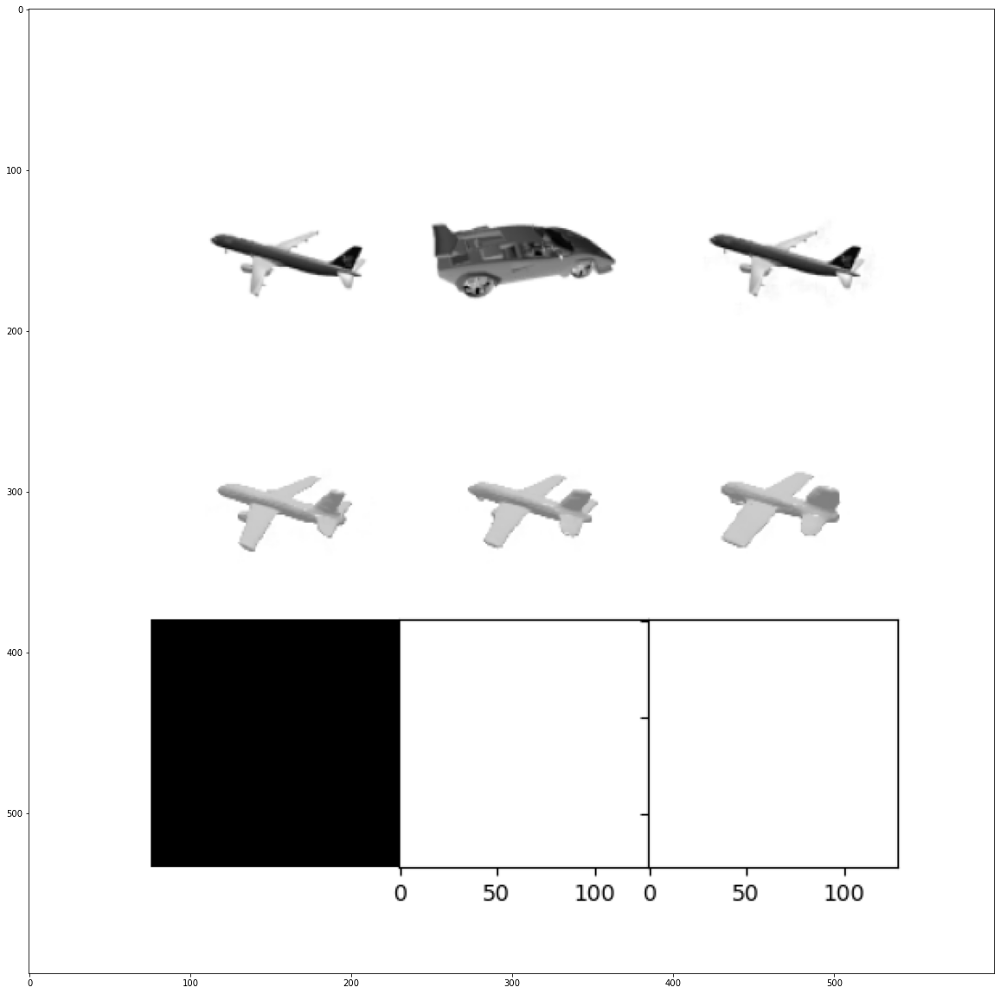

In [13]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1600_layer_3/'
output_filename = 'deepdream_images.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
#image = np.random.random(size=(100,100))
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)

In [16]:
interpolation_dir = output_filepath
files = os.listdir(interpolation_dir)
verts = []
faces = []
verts_rgb = []
titles = []
for file in files:
    if file.split('.')[1] == 'ply':
        titles.append(file.split('/')[-1])
        vert, face = load_ply(interpolation_dir + file)
        verts.append(vert.to(device))
        faces.append(face.to(device))
        verts_rgb.append(torch.ones_like(vert).to(device))

textures = Textures(verts_rgb=verts_rgb)
interpol_mesh = Meshes(verts, faces, textures)

print(interpol_mesh.isempty())
print(interpol_mesh.num_verts_per_mesh())

images = renderer(interpol_mesh).cpu().numpy()

tensor(False, device='cuda:0')
tensor([31556, 81410, 34376, 34058, 36816, 40162], device='cuda:0')


2
3


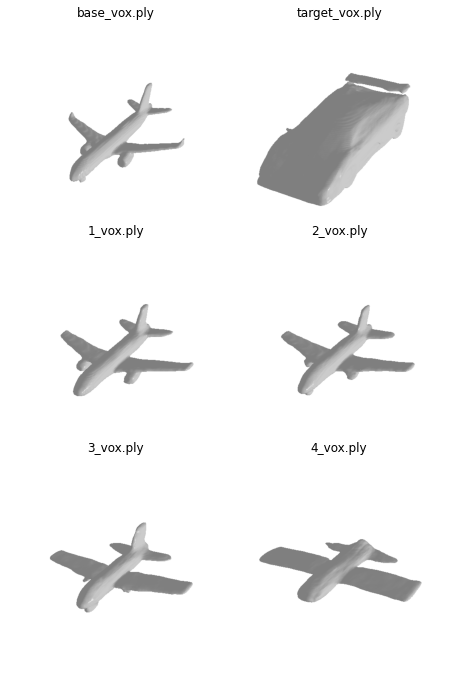

In [17]:
num_images = int(images.shape[0])
rows = 3 
cols = -int(-num_images // rows)
print(cols)
print(rows)

fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols, 
                        sharex=True, 
                        sharey=True, 
                        figsize=(cols*4,rows*4),
                        gridspec_kw={'wspace': 0, 'hspace':0}
                        )
for ax, im in zip(axs.flatten(), range(num_images)):
    ax.set_title(titles[im])
    ax.imshow(images[im,:,:,:3])
    ax.axis('off')


In [18]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1600_layer_3/'
output_filename = 'image_progression.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
#image = np.random.random(size=(100,100))
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)

FileNotFoundError: [Errno 2] No such file or directory: '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1600_layer_3/image_progression.png'

In [355]:
interpolation_dir = output_filepath
files = os.listdir(interpolation_dir)
verts = []
faces = []
verts_rgb = []
titles = []
for file in files:
    if file.split('.')[1] == 'ply':
        titles.append(file.split('/')[-1])
        vert, face = load_ply(interpolation_dir + file)
        verts.append(vert.to(device))
        faces.append(face.to(device))
        verts_rgb.append(torch.ones_like(vert).to(device))

textures = Textures(verts_rgb=verts_rgb)
interpol_mesh = Meshes(verts, faces, textures)

print(interpol_mesh.isempty())
print(interpol_mesh.num_verts_per_mesh())

images = renderer(interpol_mesh).cpu().numpy()

tensor(False, device='cuda:0')
tensor([31556, 82180, 31556, 25180, 25946, 25384, 24164, 23138, 24376, 25360,
        25412, 26706], device='cuda:0')


6
2


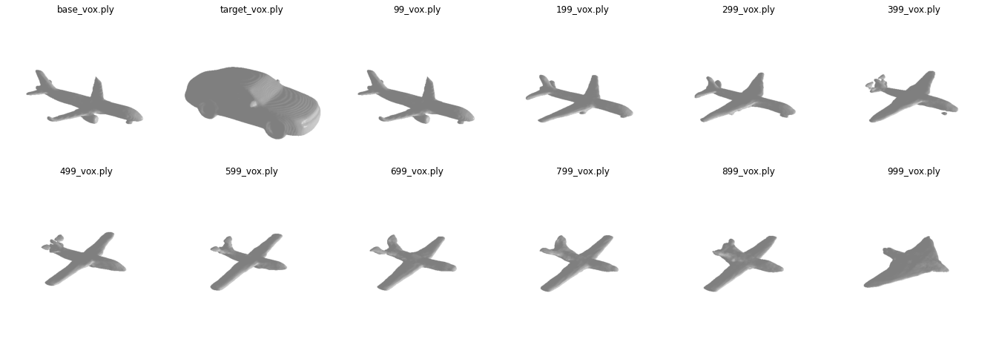

In [18]:
num_images = int(images.shape[0])
rows = 2 
cols = -int(-num_images // rows)
print(cols)
print(rows)

fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols, 
                        sharex=True, 
                        sharey=True, 
                        figsize=(cols*4,rows*4),
                        gridspec_kw={'wspace': 0, 'hspace':0}
                        )
for ax, im in zip(axs.flatten(), range(num_images)):
    ax.set_title(titles[im])
    ax.imshow(images[im,:,:,:3])
    ax.axis('off')


In [353]:
images[0,:,:,3].min()


0.0

In [311]:
def cv2_image_transform(img):
    '''
    Basic image transform used as input to IM_SVR

    :param img:
    :return:
    '''
    imgo = img[:, :, :3]
    imgo = cv2.cvtColor(imgo, cv2.COLOR_BGR2GRAY)*255
    imga = (img[:, :, 3])
    img_out = imgo * imga + 255.0 * (1 - imga)
    img_out = np.round(img_out).astype(np.uint8)

    img_out = img_out.astype(np.float32)

    return imgo

In [312]:
test = cv2_image_transform(images[0])
test.max()

255.0

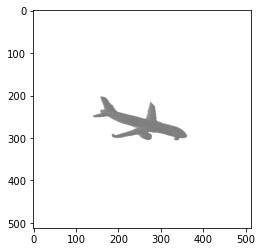

In [313]:
plt.imshow(test, cmap='gray', vmin=0, vmax=255)

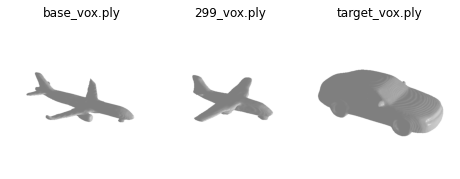

In [347]:

fig, axs = plt.subplots(nrows=1, 
                        ncols=3, 
                        sharex=True, 
                        sharey=True, 
                        figsize=(cols*8,rows*8),
                        gridspec_kw={'wspace': 0, 'hspace':0}
                        )
for ax, im in zip(axs.flatten(), [0, 4, 1]):
    ax.set_title(titles[im])
    ax.imshow(images[im,:,:,:3])
    ax.axis('off')


In [373]:
vox_file = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1500_layer_3/699_vox.ply' 
mesh = pv.read(vox_file)

# Plot using the ITKplotter
pl = pv.PlotterITK()
pl.add_mesh(mesh, smooth_shading=False)
pl.show(True)

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

In [115]:
interpolation_dir = '/data/IM-NET-pytorch/data/all_vox256_img/interpol_1600_1500/'
files = os.listdir(interpolation_dir)
verts = []
faces = []
verts_rgb = []
titles = []
for file in files:
    if file.split('.')[-1] == 'ply':
        titles.append(file.split('/')[-1])
        vert, face = load_ply(interpolation_dir + file)
        verts.append(vert.to(device))
        faces.append(face.to(device))
        verts_rgb.append(torch.ones_like(vert).to(device))

textures = Textures(verts_rgb=verts_rgb)
interpol_mesh = Meshes(verts, faces, textures)

textures = Textures(verts_rgb=verts_rgb)
interpol_mesh = Meshes(verts, faces, textures)

print(interpol_mesh.isempty())
print(interpol_mesh.num_verts_per_mesh())

images = renderer(interpol_mesh).cpu().numpy()

tensor(False, device='cuda:0')
tensor([83302, 81910, 80208, 79326, 77048, 75628, 75396, 75548, 75764, 76296],
       device='cuda:0')


5
2


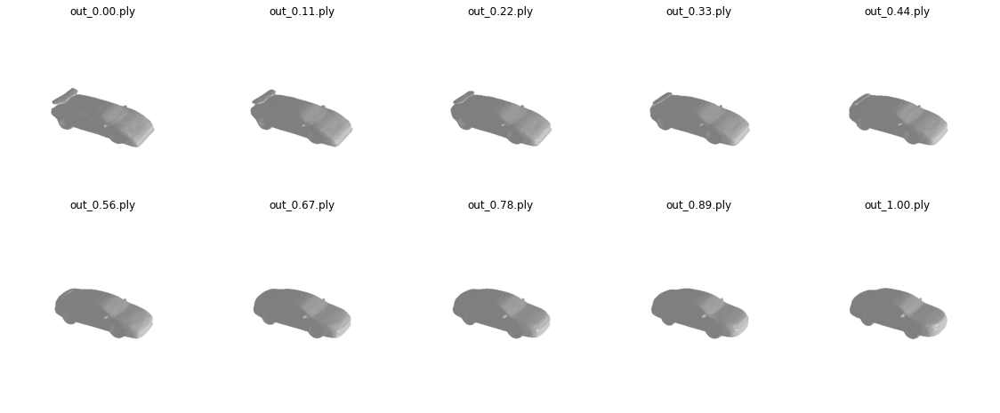

In [116]:
num_images = int(images.shape[0])
rows = 2 
cols = -int(-num_images // rows)
print(cols)
print(rows)

fig, axs = plt.subplots(nrows=rows, 
                        ncols=cols, 
                        sharex=True, 
                        sharey=True, 
                        figsize=(cols*4,rows*4),
                        gridspec_kw={'wspace': 0, 'hspace':0}
                        )
for ax, im in zip(axs.flatten(), range(num_images)):
    ax.set_title(titles[im])
    ax.imshow(images[im,:,:,:3])
    ax.axis('off')

In [233]:
vox_file = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1500_layer_3/200_vox.ply' 
mesh = pv.read(vox_file)

# Plot using the ITKplotter
pl = pv.PlotterITK()
pl.add_mesh(mesh, smooth_shading=False)
pl.show(True)

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

In [110]:
vox_file = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR1600_1500_layer_3/6_vox.ply' 
mesh = pv.read(vox_file)

# Plot using the ITKplotter
pl = pv.PlotterITK()
pl.add_mesh(mesh, smooth_shading=False)
pl.show(True)

Viewer(geometries=[{'vtkClass': 'vtkPolyData', 'points': {'vtkClass': 'vtkPoints', 'name': '_points', 'numberO…

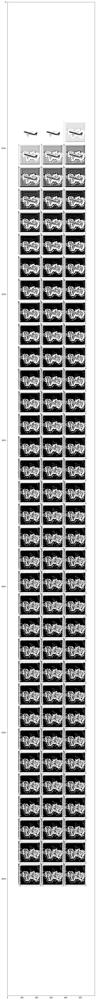

In [20]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_300_layer_3/'
output_filename = 'image_progression.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)

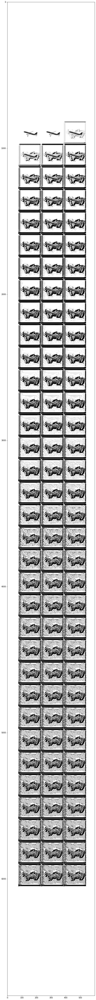

In [21]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_300_layer_3/'
output_filename = 'image_progression.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)

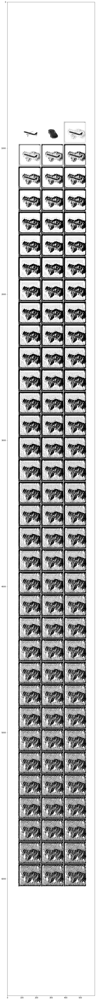

In [22]:
output_filepath = '/data/IM-NET-pytorch/data/all_vox256_img/DeepDream_SVR300_1500_layer_3/'
output_filename = 'image_progression.png'
full_file_path = output_filepath + output_filename
image = mpimg.imread(full_file_path)
plt.figure(figsize=(20,100))
plt.imshow(image, cmap='gray', vmin=0, vmax=255)